# Run a trained model on images and show results

In [1]:
import sys
sys.path.append("../src")

In [2]:
import os
import json

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import sklearn
from sklearn.metrics import confusion_matrix
import seaborn as sns
from matplotlib.colors import LogNorm

from slim_models.nets import resnet_v1, inception_resnet_v2, nasnet
from input_utils import preprocess_image_for_visualization, normalize_image, preprocess_image
from models import model_fn
from tools.utils import ImageDecoder

%matplotlib inline

In [3]:
class_id_filepath = "../data/interim/real_crop_v1/class.json"
with open(class_id_filepath, "rt") as f:
    name_to_class_id = json.loads(f.read())

id_to_class_name = {v: k for k, v in name_to_class_id.items()}

In [4]:
val_metadata_filepath = "../data/interim/real_crop_v1/crop-val_metadata.json"
with open(val_metadata_filepath, "rt") as f:
    val_metadata = json.loads(f.read())
    
samples_per_class = val_metadata["samples_per_class"]

In [5]:
obj_to_class_file = "../data/interim/real_crop_v1/obj_to_class.json"
with open(obj_to_class_file, "r") as f:
    data = json.loads(f.read())
    obj_to_class = [0] * len(data)
    for obj_id in data:
        obj_to_class[int(obj_id)] = data[obj_id]

In [6]:
def preprocess(image, preprocess_config, visualize):
    if visualize:
        image = preprocess_image_for_visualization(image, preprocess_config)
    else:
        image = preprocess_image(image, False, preprocess_config)

    image = tf.expand_dims(image, 0)
    return image

def input_fn(filepaths, preprocess_config, visualize=False):
    dataset = tf.data.Dataset.from_tensor_slices(filepaths)
    
    def read_file(filepath):
        image_str = tf.read_file(filepath)
        image_decoded = tf.image.decode_image(image_str, channels=3)
        image_decoded.set_shape((None, None, 3))
        return image_decoded
           
    dataset = dataset.map(read_file)
    dataset = dataset.map(lambda image: preprocess(image, preprocess_config, visualize))
    iterator = dataset.make_one_shot_iterator()
    features = {
        "image": iterator.get_next()
    }
    labels = tf.constant(1)
    return features, labels

In [86]:
model_dir = "../logs/CROP_NEW_00"
params = {
    "num_classes": 13,
    "network_name": "nasnet_large",
    "output_type": "softmax",
    "obj_to_class": obj_to_class
}
preprocess_config = {
    "network_name": "nasnet_large",
    "warp": True
}
estimator = tf.estimator.Estimator(model_fn, model_dir=model_dir, params=params)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f55a476a400>, '_log_step_count_steps': 100, '_service': None, '_task_id': 0, '_global_id_in_cluster': 0, '_save_checkpoints_secs': 600, '_num_worker_replicas': 1, '_is_chief': True, '_keep_checkpoint_every_n_hours': 10000, '_master': '', '_task_type': 'worker', '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_session_config': None, '_num_ps_replicas': 0, '_keep_checkpoint_max': 5, '_model_dir': '../logs/CROP_NEW_00', '_evaluation_master': '', '_tf_random_seed': None}


In [102]:
predict_filepaths = [
#     "/home/ubuntu/github/ai/recycle/data/raw/merged_v2/split/val/re_05_Bottle/empty_plastic_bottles_000186.jpg",
#     "/home/ubuntu/Downloads/20171204_155411.jpg",
#     "/home/ubuntu/Downloads/20171204_161156.jpg",
#     "/home/ubuntu/Downloads/20171204_161457.jpg",
#     "/home/ubuntu/Downloads/20171204_161643.jpg",
    "/home/ubuntu/Pictures/recycle/test_images/24.jpg"
]

predict_filepaths = "/home/ubuntu/Pictures/image_original/nia"
# predict_filepaths = "/media/ubuntu/Data/dataset/recycle/real/12_29_2017/done_filter_29_12/images/ChaiBinh"

In [103]:
if isinstance(predict_filepaths, str):
    folder = predict_filepaths
    predict_filepaths = []
    for dirpath, dirnames, filenames in os.walk(folder):
        for filename in filenames:
            predict_filepaths.append(os.path.join(dirpath, filename))
            
    predict_filepaths = sorted(predict_filepaths)
predict_filepaths

['/home/ubuntu/Pictures/image_original/nia/out_674.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_675.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_676.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_677.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_678.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_679.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_680.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_681.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_682.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_683.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_684.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_685.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_686.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_687.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_688.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_689.jpg',
 '/home/ubuntu/Pictures/image_original/nia/out_690.jpg',
 '/home/ubuntu/Pictures/image_o

In [104]:
exp_predictions = []
class_ids = []
for i, pred in enumerate(estimator.predict(
        input_fn=lambda: input_fn(predict_filepaths, preprocess_config))):
    class_id = pred['class_id'][0]
    prob = pred['probs'][0]
    exp_predictions.append((id_to_class_name[class_id], str(prob[class_id])))
    class_ids.append(class_id)

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ../logs/CROP_NEW_00/model.ckpt-60000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


In [105]:
correct_class = 2
class_ids = np.array(class_ids)
print("Number of correct predictions:", np.sum(class_ids == correct_class))
print("Accuracy:", np.sum(class_ids == correct_class) * 1. / len(class_ids))

Number of correct predictions: 71
Accuracy: 0.9726027397260274


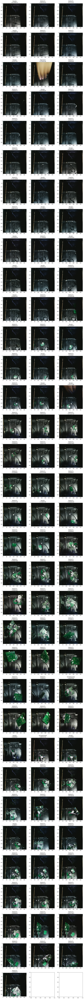

In [101]:
ncols = 3
nrows = len(predict_filepaths) // ncols + 1
fig, axs = plt.subplots(nrows, ncols,
                        figsize=(16, 6 * nrows), squeeze=False)

f, l = input_fn(predict_filepaths, preprocess_config, visualize=True)
with tf.Session() as sess:
    try:
        for i, filepath in enumerate(predict_filepaths):
            a, b = sess.run([f, l])
            img = a["image"][0].astype(np.uint8)
            axs[i // ncols][i % ncols].imshow(img)
            axs[i // ncols][i % ncols].set_title(
                exp_predictions[i][0] + "\n" + str(exp_predictions[i][1]))
    except Exception as e:
        print(e)


# Confusion matrix of trained model on validation data

In [10]:
def input_fn_from_tfrecords(file_patterns, batch_size, visualize=False, network_name="resnet_v1_101"):
    """Input function for Resnet Estimator."""
    filenames = []
    for pattern in file_patterns.split(","):
        filenames.extend(tf.gfile.Glob(pattern))

    def parser(record):
        """Parse tf.Example protobuf."""
        keys_to_features = {
            "image/data": tf.FixedLenFeature((), tf.string),
            "label": tf.FixedLenFeature((), tf.int64)
        }
        parsed = tf.parse_single_example(record, features=keys_to_features)

        image = tf.image.decode_image(parsed["image/data"], channels=3)
        label = parsed["label"]

        return image, label
    
    def preprocess(image, label):
        if visualize:
            image = preprocess_image_for_visualization(image, network_name)
        else:
            image = preprocess_image(image, network_name, is_training=False)
            
        label = tf.to_int32(label)
        return {"image": image}, label

    with tf.device('/cpu:0'):
        # Create the dataset
        dataset = tf.data.TFRecordDataset(filenames, buffer_size=256 * 2 ** 20)
        dataset = dataset.map(parser, num_parallel_calls=batch_size * 10)
        dataset = dataset.map(preprocess,
                              num_parallel_calls=batch_size * 10)
        dataset = dataset.batch(batch_size=batch_size)
        dataset = dataset.prefetch(batch_size)

        # Create iterator for the dataset
        iterator = dataset.make_one_shot_iterator()
        features, labels = iterator.get_next()

    return features, labels

In [13]:
batch_size = 64
file_patterns = "../data/interim/real_crop_v1/crop-val-*"
predictions = None
probs = None
for i, pred in enumerate(estimator.predict(
        input_fn=lambda: input_fn_from_tfrecords(file_patterns, batch_size, 
                                                 network_name=params["network_name"]))):
    class_ids = pred['class_id']
    p = pred["probs"][np.arange(len(class_ids)), class_ids]
    if predictions is None:
        predictions = class_ids
        probs = p
    else:
        predictions = np.hstack((predictions, class_ids))
        probs = np.hstack((probs, p))

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ../logs/CROP_NEW_00/model.ckpt-60000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


In [14]:
f, l = input_fn_from_tfrecords(file_patterns, batch_size, visualize=True)
images = None
labels = None
with tf.Session() as sess:
    try:
        while True:
            a, b = sess.run([f, l])
            if labels is None:
                labels = b
                images = a["image"]
            else:
                labels = np.hstack((labels, b))
                images = np.concatenate((images, a["image"]))
    except Exception as e:
        pass
    
images = images.astype(np.uint8)
print("Accuracy on validation set:", np.mean(predictions == labels))

Accuracy on validation set: 0.7262745098039216


Text(184.92,0.5,'Label')

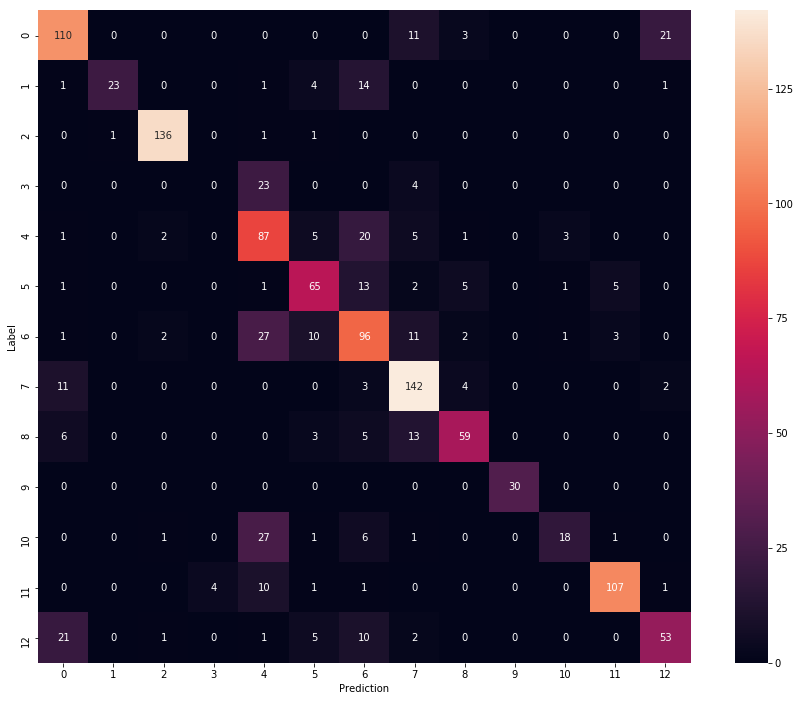

In [15]:
cm = confusion_matrix(labels, predictions)
plt.figure(figsize=(16, 12))
sns.heatmap(cm, annot=True, fmt="d", square=True)
plt.xlabel("Prediction")
plt.ylabel("Label")

# Binary accuracy for recycle/non-recycle classes

In [17]:
obj_to_class_file = "../data/interim/real_crop_v1/obj_to_class.json"
with open(obj_to_class_file, "rt") as f:
    obj_to_class = json.loads(f.read())

In [18]:
binary_labels = np.array([obj_to_class[str(l)] for l in labels])
binary_predictions = np.array([obj_to_class[str(p)] for p in predictions])

In [19]:
print("Binary accuracy:", np.mean(np.equal(binary_labels, 
                                           binary_predictions).astype(np.float32)))

Binary accuracy: 0.8745098


# Per-class accuracy

In [20]:
row_sum = np.sum(cm, axis=1)
per_class_acc = np.diag(cm) / row_sum
print("Mean per-class accuracy:", np.mean(per_class_acc))

Mean per-class accuracy: 0.662339383928628


In [21]:
sorted_idxs = [t[0] for t in sorted(enumerate(per_class_acc), key=lambda x: x[1])]
for idx in sorted_idxs:
    print("{:2d} {:41}: {:.6f} {:3d}".format(idx, id_to_class_name[idx][:40], 
                                       per_class_acc[idx], samples_per_class[idx]))

 3 GiayAn                                   : 0.000000  27
10 TuiGiay                                  : 0.327273  55
 1 DoDienTu                                 : 0.522727  44
12 TuypKem                                  : 0.569892  93
 6 HopCarton                                : 0.627451 153
 8 LonKimLoai                               : 0.686047  86
 5 GiayGoi                                  : 0.698925  93
 4 GiayBaoTapChi                            : 0.701613 124
 0 ChaiBinh                                 : 0.758621 145
11 TuiNilon                                 : 0.862903 124
 7 HuToDiaLyHop                             : 0.876543 162
 2 DungCu                                   : 0.978417 139
 9 ThucAn                                   : 1.000000  30


Text(0,0.5,'Accuracy')

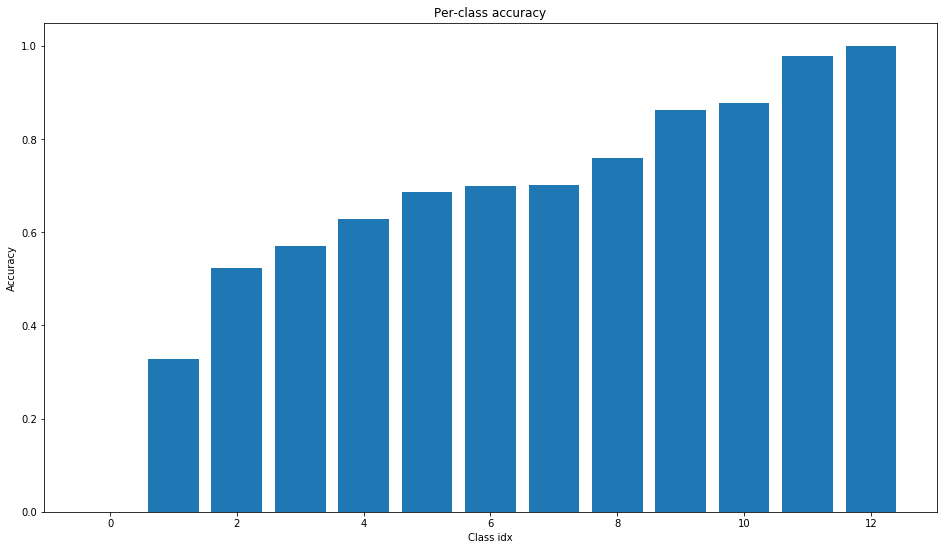

In [22]:
plt.figure(figsize=(16, 9))
plt.bar(range(len(per_class_acc)), sorted(per_class_acc))
plt.title("Per-class accuracy")
plt.xlabel("Class idx")
plt.ylabel("Accuracy")

Text(184.92,0.5,'Label')

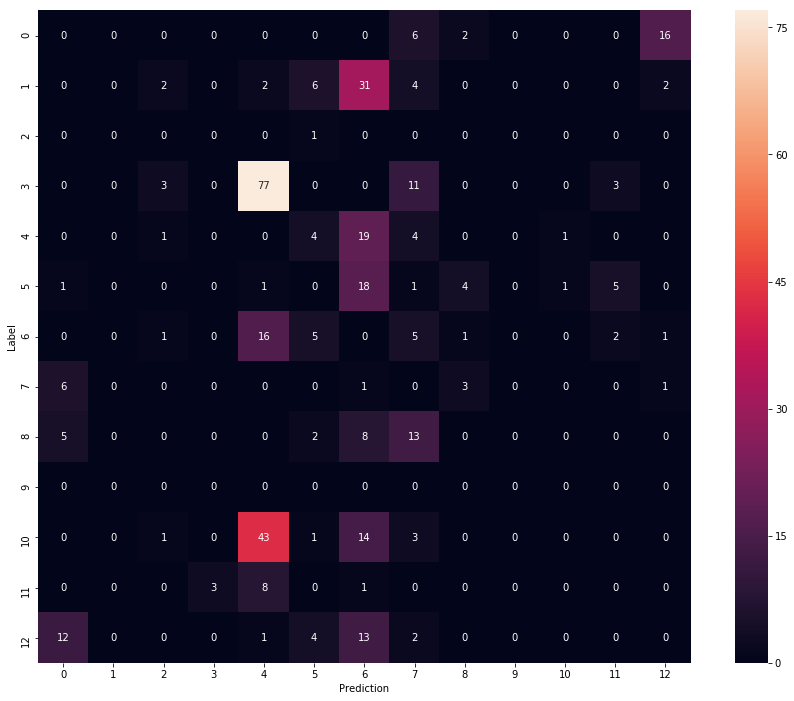

In [35]:
wrong_percentage = cm / row_sum.reshape((-1, 1))
np.fill_diagonal(wrong_percentage, 0)
plt.figure(figsize=(16, 12))
sns.heatmap((100 * wrong_percentage).astype(np.int32), annot=True, fmt="d", square=True)
plt.xlabel("Prediction")
plt.ylabel("Label")

In [49]:
id_to_class_name[3], id_to_class_name[13]

('non_04_Styrofoam_containers', 're_04_Wrapping_paper')

# Examples of wrong predictions

In [36]:
def wrong_predictions(predictions, labels, probs, filter_labels=None):
    idxs = np.argsort(probs)[::-1]
    for idx in idxs:
        if labels[idx] != predictions[idx] and \
            (filter_labels is None or labels[idx] == filter_labels):
            yield idx

In [52]:
wrong_idxs = list(wrong_predictions(predictions, labels, probs, filter_labels=0))

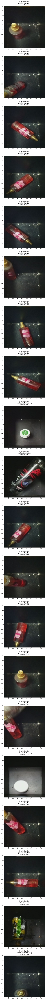

In [53]:
num_images = min(len(wrong_idxs), 20)
fig, axs = plt.subplots(num_images, figsize=(10, 8 * num_images))
for i, idx in enumerate(wrong_idxs[:num_images]):
    axs[i].imshow(images[idx])
    axs[i].set_title("label: {}\npredict: {}\nprobs: {:.4f}".format(
        id_to_class_name[labels[idx]], id_to_class_name[predictions[idx]], probs[idx]))

# ROC

In [46]:
binary_labels = np.array([obj_to_class[str(l)] for l in labels])
binary_predictions = np.array([obj_to_class[str(p)] for p in predictions])

In [48]:
conf = probs.copy()
conf[binary_predictions == 0] = 1 - conf[binary_predictions == 0]
idxs = np.argsort(conf)[::-1]

tp = 0
fp = 0
fn = np.sum(binary_labels == 1)
tn = np.sum(binary_labels == 0)
tpr, fpr, acc = [], [], []

for k, i in enumerate(idxs):
    if binary_labels[i]:
        tp += 1
        fn -= 1
    else:
        fp += 1
        tn -= 1
    tpr.append(tp / (tp + fn))
    fpr.append(fp / (fp + tn))
    acc.append((tp + tn) / (tp + tn + fp + fn))
    print(conf[i], tpr[-1], fpr[-1], acc[-1])
        

0.999836 0.00115740740741 0.0 0.323137254902
0.999791 0.00231481481481 0.0 0.323921568627
0.999747 0.00347222222222 0.0 0.324705882353
0.999747 0.00462962962963 0.0 0.325490196078
0.999708 0.00578703703704 0.0 0.326274509804
0.999674 0.00694444444444 0.0 0.327058823529
0.999622 0.00810185185185 0.0 0.327843137255
0.999422 0.00925925925926 0.0 0.32862745098
0.999386 0.0104166666667 0.0 0.329411764706
0.999344 0.0115740740741 0.0 0.330196078431
0.999248 0.0127314814815 0.0 0.330980392157
0.999126 0.0138888888889 0.0 0.331764705882
0.999046 0.0150462962963 0.0 0.332549019608
0.998912 0.0162037037037 0.0 0.333333333333
0.998856 0.0173611111111 0.0 0.334117647059
0.998704 0.0185185185185 0.0 0.334901960784
0.998458 0.0196759259259 0.0 0.33568627451
0.998424 0.0208333333333 0.0 0.336470588235
0.998322 0.0219907407407 0.0 0.337254901961
0.998303 0.0231481481481 0.0 0.338039215686
0.99823 0.0243055555556 0.0 0.338823529412
0.998171 0.025462962963 0.0 0.339607843137
0.998129 0.0266203703704 0.0

0.595869 0.773148148148 0.155717761557 0.796078431373
0.595317 0.774305555556 0.155717761557 0.796862745098
0.594746 0.774305555556 0.158150851582 0.796078431373
0.594652 0.775462962963 0.158150851582 0.796862745098
0.593817 0.77662037037 0.158150851582 0.797647058824
0.592268 0.77662037037 0.160583941606 0.796862745098
0.591961 0.77662037037 0.16301703163 0.796078431373
0.590573 0.777777777778 0.16301703163 0.796862745098
0.590517 0.777777777778 0.165450121655 0.796078431373
0.58963 0.777777777778 0.167883211679 0.795294117647
0.588611 0.778935185185 0.167883211679 0.796078431373
0.588221 0.780092592593 0.167883211679 0.796862745098
0.587122 0.78125 0.167883211679 0.797647058824
0.58678 0.78125 0.170316301703 0.796862745098
0.586307 0.782407407407 0.170316301703 0.797647058824
0.586269 0.783564814815 0.170316301703 0.798431372549
0.585077 0.784722222222 0.170316301703 0.799215686275
0.584228 0.784722222222 0.172749391727 0.798431372549
0.584217 0.78587962963 0.172749391727 0.799215686

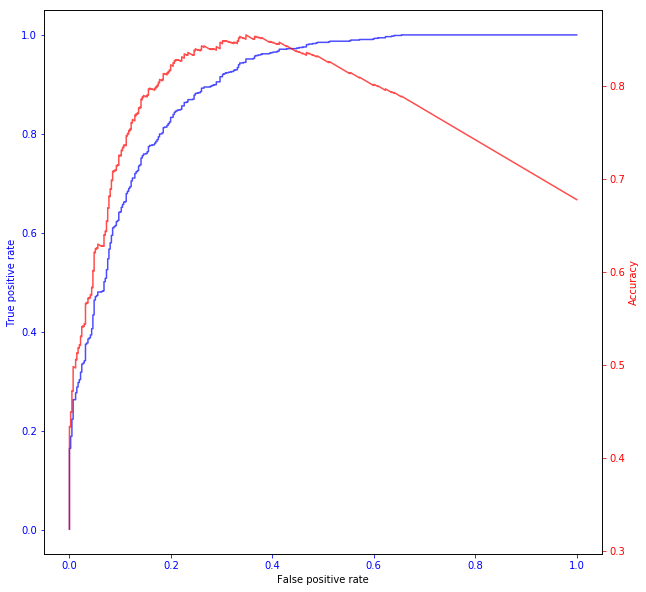

In [49]:
fig, ax1 = plt.subplots(figsize=(10, 10))
ax1.plot(fpr, tpr, 'b-', alpha=0.7)
ax1.set_xlabel("False positive rate")
ax1.set_ylabel("True positive rate", color='b')
ax1.tick_params(colors='b')

ax2 = ax1.twinx()
ax2.plot(fpr, acc, 'r-', alpha=0.7)
ax2.set_ylabel('Accuracy', color='r')
ax2.tick_params(colors='r')

# Test image transformation

In [9]:
import cv2
from input_utils import warp_image

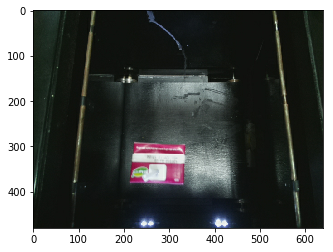

In [10]:
image_path = "/home/ubuntu/Pictures/image_original/images_hopcarton/out_170.jpg"
image_str = tf.read_file(image_path)
image_decoded = tf.image.decode_image(image_str, channels=3)
with tf.Session() as sess_img:
    image = sess_img.run(image_decoded)
    
plt.imshow(image)

In [11]:
image_pld = tf.placeholder(tf.uint8, shape=[None, None, 3])
with tf.Session() as sess_img:
#     warp_image = sess_img.run(warp_image(image_pld), feed_dict={image_pld: image})
    warp_image = sess_img.run(preprocess(image_pld, 
                                         {"warp": True, "network_name": "nasnet_large"}, 
                                         False), 
                              feed_dict={image_pld: image})
#     warp_image = (((warp_image[0] / 2.0) + 0.5) * 255).astype(np.uint8)
# plt.imshow(warp_image)

In [12]:
image_path = "/home/ubuntu/Pictures/image_crop/images_hopcarton/out_170.jpg"
image_str = tf.read_file(image_path)
image_decoded = tf.image.decode_image(image_str, channels=3)
with tf.Session() as sess_img:
    image2 = sess_img.run(image_decoded)
    warp_image2 = sess_img.run(preprocess(image_pld,
                                          {"warp": False, "network_name": "nasnet_large"}, 
                                          False), 
                               feed_dict={image_pld: image2})
#     warp_image2 = (((warp_image2[0] / 2.0) + 0.5) * 255).astype(np.uint8)
# plt.imshow(warp_image2)

In [13]:
np.average(np.abs(warp_image.astype(np.float32) - warp_image2.astype(np.float32)))

0.008491785

In [14]:
def identity_input_fn(imgs):
    dataset = tf.data.Dataset.from_tensors(imgs)
    iterator = dataset.make_one_shot_iterator()
    features = {
        "image": iterator.get_next()
    }
    labels = tf.constant(1)
    return features, labels

In [15]:
res1 = None
for res in estimator.predict(input_fn=lambda: identity_input_fn(warp_image)):
    print(res)
    res1 = res

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ../logs/CROP_NEW_00/model.ckpt-60000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
{'probs': array([[7.9422601e-04, 6.9209011e-03, 2.6691888e-02, 4.0739847e-06,
        1.9261658e-02, 3.3129916e-01, 5.4313689e-01, 2.6261734e-02,
        2.3398721e-03, 5.0376309e-10, 1.1341482e-02, 4.2441087e-03,
        2.7703986e-02]], dtype=float32), 'logits': array([[ -7.1655707,  -5.0006375,  -3.6508236, -12.438317 ,  -3.9770668,
         -1.1321616,  -0.637822 ,  -3.6670704,  -6.0850873, -21.436342 ,
         -4.5067163,  -5.4896517,  -3.613607 ]], dtype=float32), 'class_id': array([6]), 'global_pool': array([0.02137628, 0.603576  , 0.09882889, ..., 0.01921988, 0.41852468,
       0.0041754 ], dtype=float32), 'binary_class_id': array([1], dtype=int32)}


In [16]:
res2 = None
for res in estimator.predict(input_fn=lambda: identity_input_fn(warp_image2)):
    print(res)
    res2 = res

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ../logs/CROP_NEW_00/model.ckpt-60000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
{'probs': array([[3.8555264e-04, 2.4094079e-02, 1.2536100e-01, 3.8984897e-08,
        1.3687891e-02, 3.1446084e-01, 4.2651221e-01, 3.1554740e-02,
        1.5353151e-02, 1.3395671e-11, 8.5607963e-03, 6.9607206e-04,
        3.9333627e-02]], dtype=float32), 'logits': array([[ -9.769427 ,  -5.6343837,  -3.9851522, -18.968687 ,  -6.199838 ,
         -3.0654902,  -2.7607088,  -5.364626 ,  -6.085029 , -26.944683 ,
         -6.6691566,  -9.178652 ,  -5.14427  ]], dtype=float32), 'class_id': array([6]), 'global_pool': array([0.03387174, 0.4599296 , 0.03971757, ..., 0.10321786, 0.7244556 ,
       0.00465615], dtype=float32), 'binary_class_id': array([1], dtype=int32)}


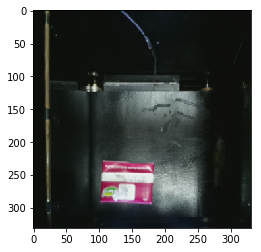

In [17]:
plt.imshow(warp_image[0] * 0.5 + 0.5)

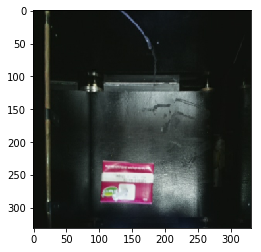

In [18]:
plt.imshow(warp_image2[0] * 0.5 + 0.5)